In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import classification_report

import seaborn as sns

import cv2

import shutil
from pathlib import Path
import os

from sklearn.model_selection import train_test_split

from sklearn.utils.class_weight import compute_class_weight

import tensorflow as tf
from tensorflow.keras.preprocessing import image_dataset_from_directory
from tensorflow.keras.layers import Input, Dense, Dropout, RandomRotation, RandomFlip, RandomZoom, RandomContrast, Rescaling, Conv2D, SeparableConv2D
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint, TensorBoard

from tensorflow.keras.applications import Xception
from tensorflow.keras.applications.xception import preprocess_input

from keras.utils import plot_model

from Libraries.get_absolute_path import get_absolute_path

# Partie 1 : Ouverture des images dans des datasets

In [2]:
train_folder = get_absolute_path(r"data\processed\train_test_split\train")
validation_folder = get_absolute_path(r"data\processed\train_test_split\validation")
test_folder = get_absolute_path(r"data\processed\train_test_split\test")


train_ds = image_dataset_from_directory(train_folder,
                                        label_mode="int",
                                        shuffle=True,
                                        batch_size=32,
                                        image_size=(299,299),
                                        seed=42)

val_ds = image_dataset_from_directory(validation_folder,
                                      label_mode="int",
                                      shuffle=True,
                                      batch_size=32,
                                      image_size=(299,299),
                                      seed=42)

test_ds = image_dataset_from_directory(test_folder,
                                       label_mode="int",
                                       shuffle=True,
                                       batch_size=32,
                                       image_size=(299,299),
                                       seed=42)
class_names = train_ds.class_names

Found 16932 files belonging to 4 classes.
Found 2116 files belonging to 4 classes.
Found 2117 files belonging to 4 classes.


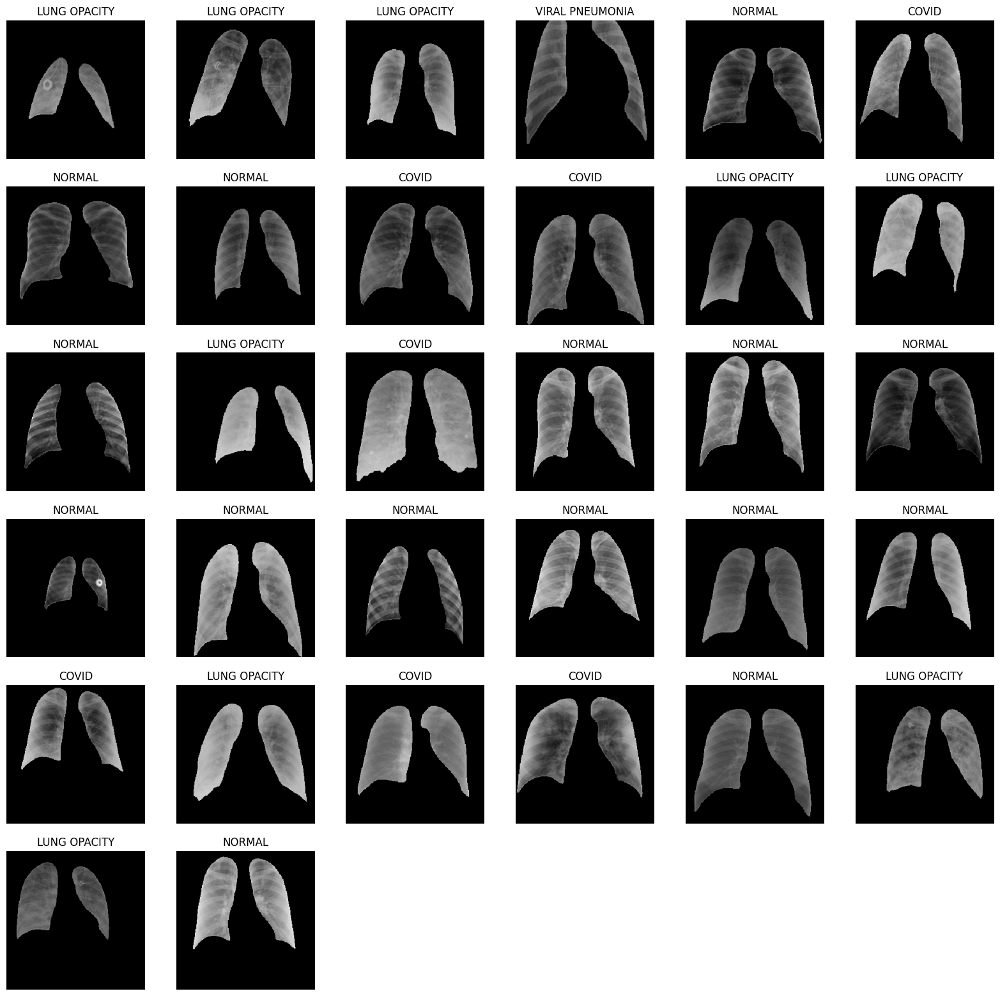

In [6]:
# Visualisation d'un échantillon des données

plt.figure(figsize=(20,40))

for images, labels in train_ds.take(1):  # Prendre un lot d'images et de labels
    for i, image in enumerate(images):
        plt.subplot(12,6,i+1)
        image = image / 255
        plt.imshow(image)
        label = labels[i].numpy()
        label_name = class_names[label]
        plt.title(label_name)
        plt.axis('off')

plt.show()

In [3]:
# Comme nous avons des classes déséquilibrées, nous allons utiliser des poids pondérés par leur présence dans le dataset. Pour ça on utilise la fonction
# compute_class_weight

labels = np.concatenate([y for _, y in test_ds], axis=0)

# Calcul des poids des classes
class_labels = np.unique(labels)
class_weight = compute_class_weight(class_weight='balanced', classes=class_labels, y=labels)
class_weight_dict = dict(enumerate(class_weight))

print("Poids des classes :", class_weight_dict)
#class_weight_dict = {0: 1.4631870031109575, 1: 0.8802245789145352, 2: 0.5191317144959529, 3: 3.934014869888476}

print(class_names)

Poids des classes : {0: 1.4620165745856353, 1: 0.8791528239202658, 2: 0.5193817468105987, 3: 3.949626865671642}
['COVID', 'LUNG_OPACITY', 'NORMAL', 'VIRAL_PNEUMONIA']


In [4]:
# Optimisation du chargement
train_ds = train_ds.cache().prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=tf.data.AUTOTUNE)
test_ds = test_ds.cache().prefetch(buffer_size=tf.data.AUTOTUNE)

# Partie 2 : Preprocessing

In [6]:
# Normalisation
train_ds = train_ds.map(lambda img, label: (preprocess_input(img), label))
val_ds = val_ds.map(lambda img, label: (preprocess_input(img), label))
test_ds = test_ds.map(lambda img, label: (preprocess_input(img), label))

# Partie 3 : Transfert Learning avec Xception

In [ ]:
# Définition des callbacks

model_path = r"notebooks\AntoineB\artifacts\models\model_tl_xception1.keras"

modelcheckpoint = ModelCheckpoint(filepath=model_path,
                                  monitor='val_loss',
                                  verbose=0,
                                  save_best_only=True,
                                  mode="min")

earlystop = EarlyStopping(monitor="val_loss",
                          mode="min",
                          min_delta=0,
                          patience=10,
                          verbose=1,
                          restore_best_weights=True)

reducelr = ReduceLROnPlateau(monitor="val_loss",
                             min_delta=0.001,
                             patience=3,
                             factor=0.5,
                             cooldown=2,
                             verbose=1)

## Partie 3.1 : Entraînement sans data augmentation

In [2]:
with tf.device('/GPU:0'):

  # Modèle Xception
  base_model = Xception(weights='imagenet', include_top=False, input_shape=(299,299,3), pooling="max")

  # Freeze des couches du Xception
  base_model.trainable = False

  # Couche d'entrée
  inputs = Input(shape=(299, 299, 3))

  # Data augmentation
  #x = RandomFlip("horizontal")(inputs)
  #x = RandomRotation(0.2)(x)
  #x = RandomZoom(0.2)(x)
  #x = RandomContrast(0.2)(x)

  # Construction du modèle
  x = base_model(inputs)
  x = Dense(512, activation="relu")(x)
  x = Dropout(0.5)(x)
  outputs = Dense(4, activation="softmax")(x)

  model = Model(inputs=inputs, outputs=outputs)
  optimizer = tf.keras.optimizers.Adamax(learning_rate=0.001)
  model.compile(loss='sparse_categorical_crossentropy', optimizer=optimizer, metrics=['accuracy'])

  model.summary()

83683744/83683744 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 299, 299, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ xception (Functional)                │ (None, 2048)                │      20,861,480 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 512)                 │       1,049,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 4)                   │           2,052 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 21,912,620 (83.59 MB)

 Trainable params: 1,051,140 (4.01 MB)

 Non-trainable params: 20,861,480 (79.58 MB)

In [ ]:
plot_model(model, show_shapes=True, show_layer_names=True, expand_nested=True)

In [ ]:
with tf.device('/GPU:0'):
  history_model = model.fit(train_ds,
                            validation_data=val_ds,
                            epochs=100,
                            batch_size=32,
                            class_weight=class_weight_dict,
                            callbacks=[earlystop, reducelr, modelcheckpoint])

Epoch 1/100
530/530 ━━━━━━━━━━━━━━━━━━━━ 558s 1s/step - accuracy: 0.5905 - loss: 1.4952 - val_accuracy: 0.7476 - val_loss: 0.6218 - learning_rate: 0.0010
Epoch 2/100
530/530 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - accuracy: 0.7021 - loss: 0.6349 - val_accuracy: 0.7519 - val_loss: 0.6044 - learning_rate: 0.0010
Epoch 3/100
530/530 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - accuracy: 0.7324 - loss: 0.5791 - val_accuracy: 0.7462 - val_loss: 0.6033 - learning_rate: 0.0010
Epoch 4/100
530/530 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - accuracy: 0.7506 - loss: 0.5478 - val_accuracy: 0.7547 - val_loss: 0.5959 - learning_rate: 0.0010
Epoch 5/100
530/530 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - accuracy: 0.7592 - loss: 0.5337 - val_accuracy: 0.7561 - val_loss: 0.5957 - learning_rate: 0.0010
Epoch 6/100
530/530 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step - accuracy: 0.7664 - loss: 0.5026 - val_accuracy: 0.7717 - val_loss: 0.5645 - learning_rate: 0.0010
Epoch 7/100
530/530 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - accuracy: 0.77

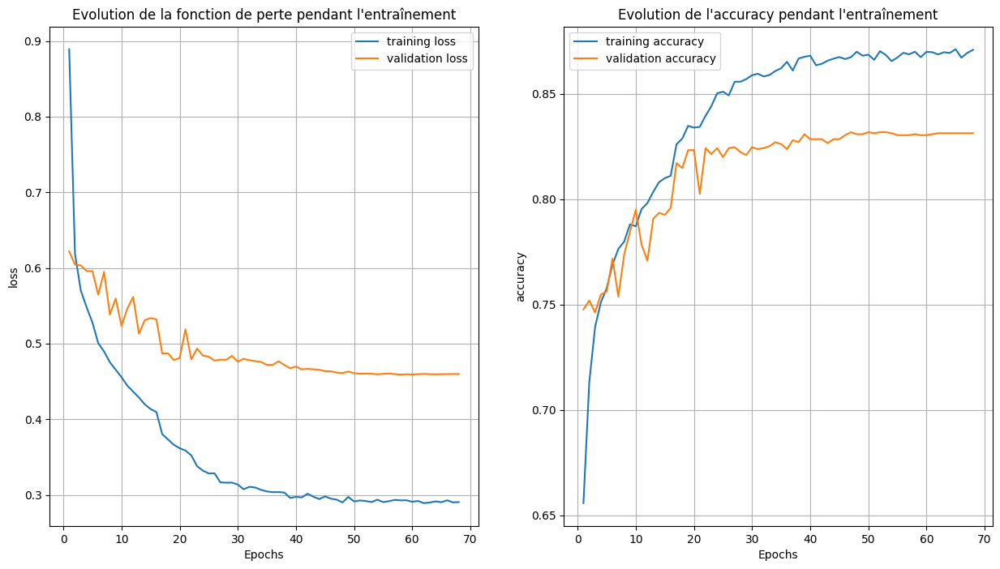

In [ ]:
# Visualisation de l'historique de'entraînement
train_loss = history_model.history['loss']
validation_loss = history_model.history['val_loss']

train_acc = history_model.history['accuracy']
validation_acc = history_model.history['val_accuracy']

plt.figure(figsize=(15,8))
plt.subplot(121)
plt.plot(np.arange(1,69,1), train_loss, label='training loss')
plt.plot(np.arange(1,69,1), validation_loss, label='validation loss')
plt.title("Evolution de la fonction de perte pendant l'entraînement")
plt.xlabel('Epochs')
plt.ylabel("loss")
plt.legend()
plt.grid('off')

plt.subplot(122)
plt.plot(np.arange(1,69,1), train_acc, label='training accuracy')
plt.plot(np.arange(1,69,1), validation_acc, label='validation accuracy')
plt.title("Evolution de l'accuracy pendant l'entraînement")
plt.xlabel('Epochs')
plt.ylabel("accuracy")
plt.legend()
plt.grid('off')

plt.show()

On voit que les performances sur les données de validation s'améliorent rapidement jusqu'à l'epoch 20, puis semble se stabiliser alors que les performances sur les données d'entraînement continuent à s'améliorer jusqu'à la couche 30. C'est signe d'un overfitting. Je vais par la suite ajuster le early_stopping afin de permettre au modèle de s'arrêter plus tôt. On profitera pour essayer d'ajoute des couches d'augmentation pour observer s'il y a une amélioration de la généralisation

## Partie 3.2 : Ajout de data augmentation et ajustement du early stopping

In [ ]:
# Définition des callbacks

model_path = r"notebooks\AntoineB\artifacts\models\model_tl_xception_data_augmented_1.keras"

modelcheckpoint = ModelCheckpoint(filepath=model_path,
                                  monitor='val_loss',
                                  verbose=0,
                                  save_best_only=True,
                                  mode="min")

earlystop = EarlyStopping(monitor="val_loss",
                          mode="min",
                          min_delta=0,
                          patience=6,
                          verbose=1,
                          restore_best_weights=True)

reducelr = ReduceLROnPlateau(monitor="val_loss",
                             min_delta=0.001,
                             patience=4,
                             factor=0.5,
                             cooldown=2,
                             verbose=1)

In [ ]:
with tf.device('/GPU:0'):

  # Modèle Xception
  base_model = Xception(weights='imagenet', include_top=False, input_shape=(299,299,3), pooling="max")

  # Freeze des couches du Xception
  base_model.trainable = False

  # Couche d'entrée
  inputs = Input(shape=(299, 299, 3))

  # Data augmentation
  x = RandomFlip("horizontal")(inputs)
  x = RandomRotation(0.1)(x)
  x = RandomZoom(0.1)(x)
  x = RandomContrast(0.1)(x)

  # Construction du modèle
  x = base_model(x)
  x = Dense(512, activation="relu")(x)
  x = Dropout(0.5)(x)
  outputs = Dense(4, activation="softmax")(x)

  model = Model(inputs=inputs, outputs=outputs)
  optimizer = tf.keras.optimizers.Adamax(learning_rate=0.001)
  model.compile(loss='sparse_categorical_crossentropy', optimizer=optimizer, metrics=['accuracy'])

  model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)           │ (None, 299, 299, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_flip (RandomFlip)             │ (None, 299, 299, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_rotation (RandomRotation)     │ (None, 299, 299, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_zoom (RandomZoom)             │ (None, 299, 299, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_contrast (RandomContrast)     │ (None, 299, 299, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ xception (Functional)                │ (None, 2048)                │      20,861,480 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 512)                 │       1,049,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 4)                   │           2,052 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 21,912,620 (83.59 MB)

 Trainable params: 1,051,140 (4.01 MB)

 Non-trainable params: 20,861,480 (79.58 MB)

In [ ]:
with tf.device('/GPU:0'):
  history_model_2 = model.fit(train_ds,
                            validation_data=val_ds,
                            epochs=100,
                            batch_size=32,
                            class_weight=class_weight_dict,
                            callbacks=[earlystop, reducelr, modelcheckpoint])

Epoch 1/100
530/530 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step - accuracy: 0.5417 - loss: 1.4373 - val_accuracy: 0.5241 - val_loss: 1.1173 - learning_rate: 0.0010
Epoch 2/100
530/530 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step - accuracy: 0.6593 - loss: 0.7517 - val_accuracy: 0.4272 - val_loss: 1.3615 - learning_rate: 0.0010
Epoch 3/100
530/530 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step - accuracy: 0.6838 - loss: 0.7105 - val_accuracy: 0.6002 - val_loss: 1.0650 - learning_rate: 0.0010
Epoch 4/100
530/530 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step - accuracy: 0.6856 - loss: 0.7001 - val_accuracy: 0.5038 - val_loss: 1.2507 - learning_rate: 0.0010
Epoch 5/100
530/530 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step - accuracy: 0.7072 - loss: 0.6692 - val_accuracy: 0.5165 - val_loss: 1.3117 - learning_rate: 0.0010
Epoch 6/100
530/530 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step - accuracy: 0.7117 - loss: 0.6494 - val_accuracy: 0.5340 - val_loss: 1.1706 - learning_rate: 0.0010
Epoch 7/100
530/530 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - accuracy: 0.70

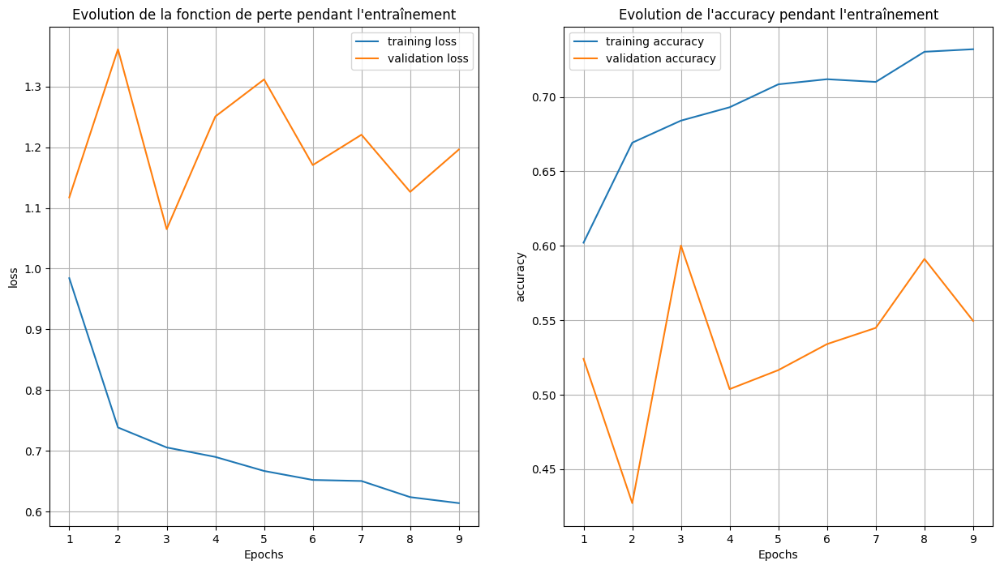

In [ ]:
# Visualisation de l'historique de'entraînement
train_loss = history_model_2.history['loss']
validation_loss = history_model_2.history['val_loss']

train_acc = history_model_2.history['accuracy']
validation_acc = history_model_2.history['val_accuracy']

plt.figure(figsize=(15,8))
plt.subplot(121)
plt.plot(np.arange(1,10,1), train_loss, label='training loss')
plt.plot(np.arange(1,10,1), validation_loss, label='validation loss')
plt.title("Evolution de la fonction de perte pendant l'entraînement")
plt.xlabel('Epochs')
plt.ylabel("loss")
plt.legend()
plt.grid('off')

plt.subplot(122)
plt.plot(np.arange(1,10,1), train_acc, label='training accuracy')
plt.plot(np.arange(1,10,1), validation_acc, label='validation accuracy')
plt.title("Evolution de l'accuracy pendant l'entraînement")
plt.xlabel('Epochs')
plt.ylabel("accuracy")
plt.legend()
plt.grid('off')

plt.show()

Nous avons créé de l'instabilité avec la data augmentation. Cela peut être à plusieurs facteurs : peut être que l'augmentation que nous avons créé n'est pas représentative des données initiales. Nous allons visualiser un échantillon:


Images d'origine


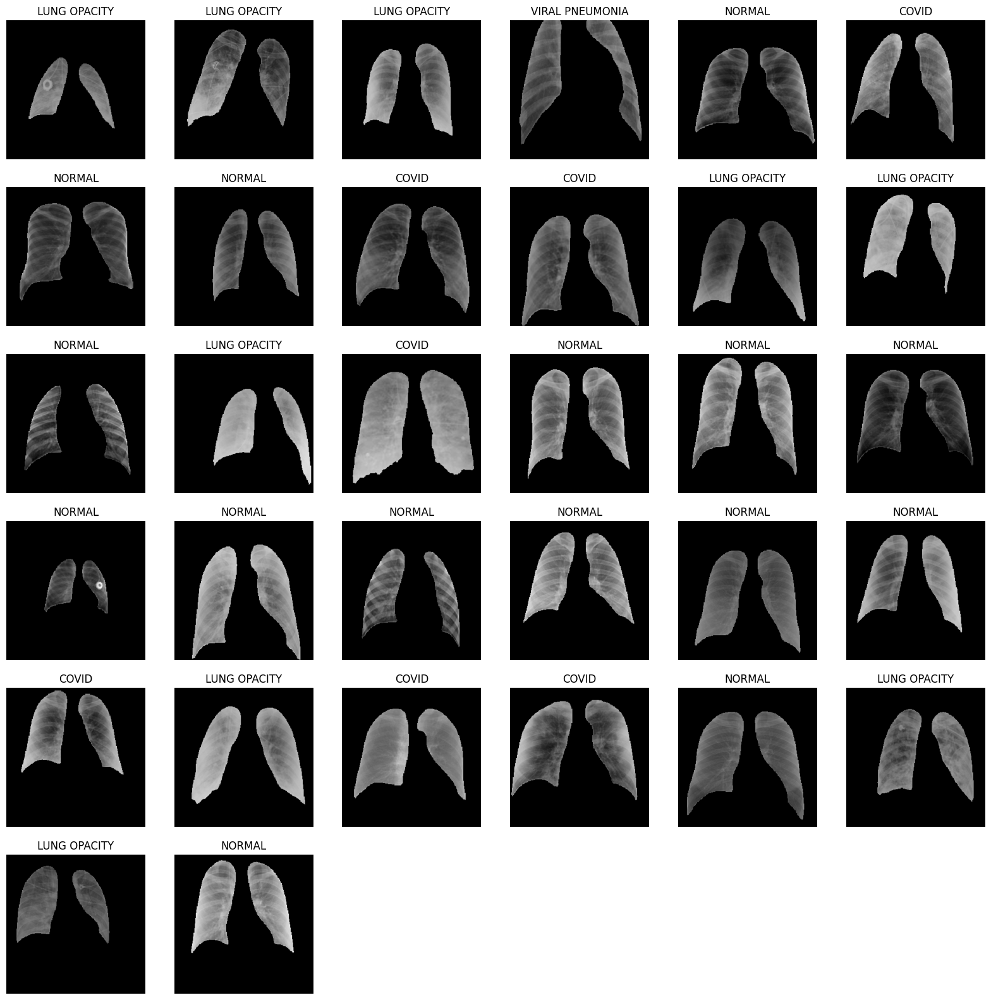

Images augmentées


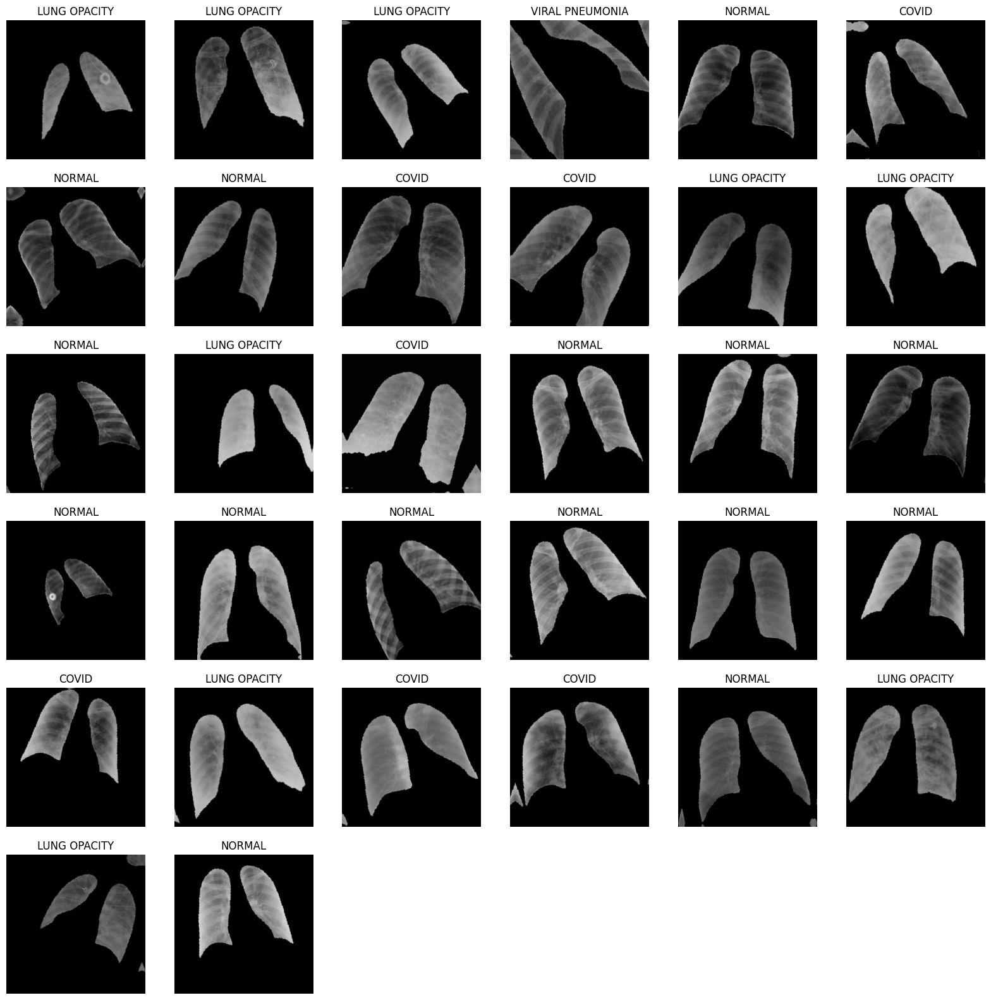

In [ ]:
data_augmentation = tf.keras.Sequential([
    RandomFlip("horizontal"),
    RandomRotation(0.1),
    RandomZoom(0.1),
    RandomContrast(0.1)
])

# Visualisation d'un échantillon des données

plt.figure(figsize=(20,20))

for images, labels in train_ds.take(1):  # Prendre un lot d'images et de labels
    augmented_images = data_augmentation(images)
    print("Images d'origine")
    for i, image in enumerate(images):
        plt.subplot(6,6,i+1)
        image = image / 255
        plt.imshow(image)
        label = labels[i].numpy()
        label_name = class_names[label]
        plt.title(label_name)
        plt.axis('off')
    plt.show()
    print("Images augmentées")
    plt.figure(figsize=(20,20))
    for i, image in enumerate(augmented_images):
        plt.subplot(6,6,i+1)
        image = image / 255
        plt.imshow(image)
        label = labels[i].numpy()
        label_name = class_names[label]
        plt.title(label_name)
        plt.axis('off')
    plt.show()


La rotation me semble trop forte, et le reflet créé par rotation et zoom me semble non pertinent. En revanche, la différence de contraste ne me paraît pas très importante Nous allons corriger ça dans la cellule suivante

Images d'origine


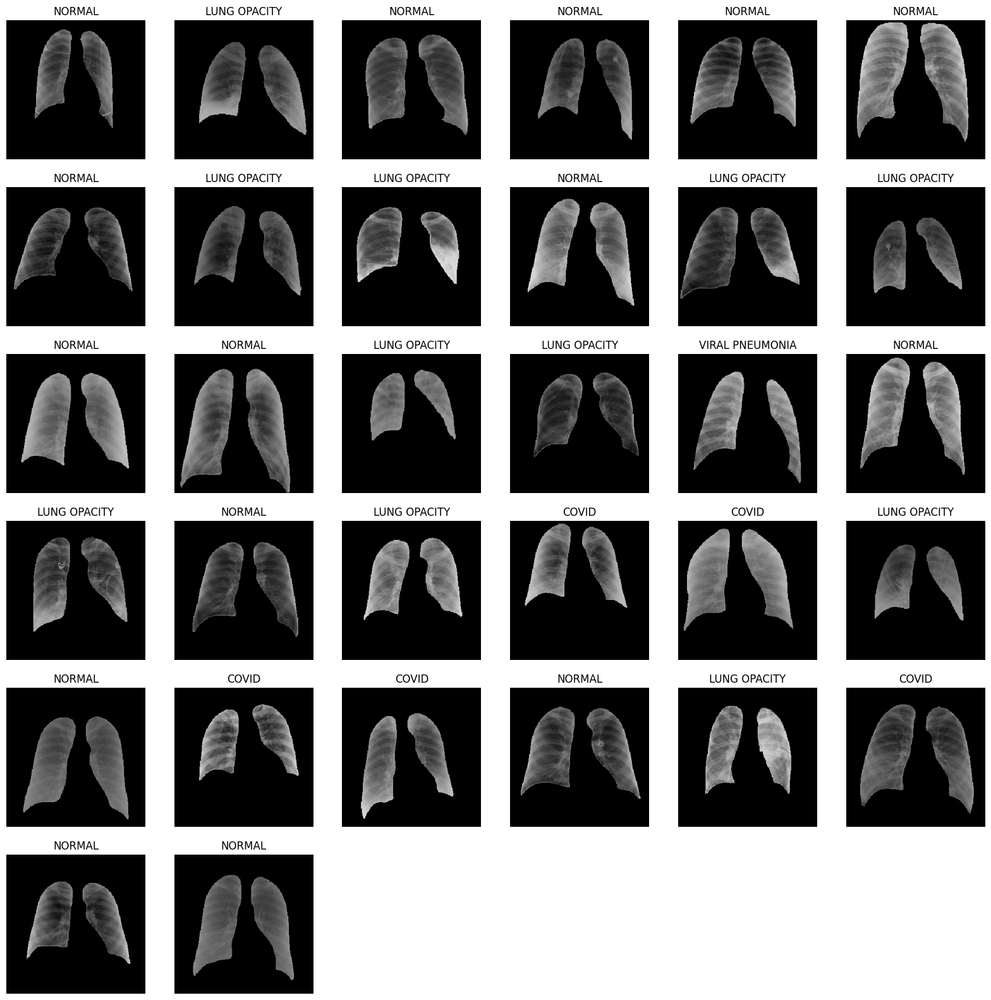

Images augmentées


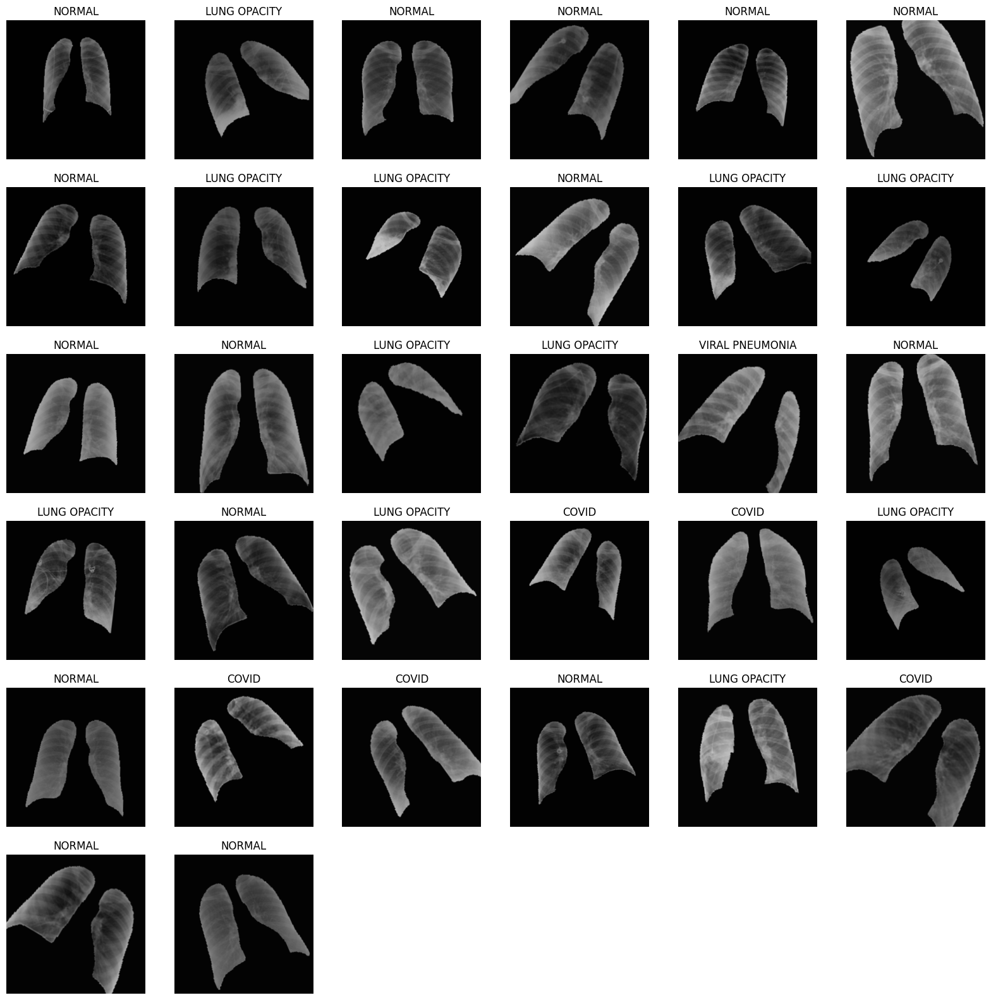

In [ ]:
data_augmentation = tf.keras.Sequential([
    RandomFlip("horizontal"),
    RandomRotation(0.1, fill_mode='constant', fill_value=0),
    RandomZoom(0.2, fill_mode='constant', fill_value=0),
    RandomContrast(0.2)
])

# Visualisation d'un échantillon des données

plt.figure(figsize=(20,20))

for images, labels in train_ds.take(1):  # Prendre un lot d'images et de labels
    augmented_images = data_augmentation(images)
    print("Images d'origine")
    for i, image in enumerate(images):
        plt.subplot(6,6,i+1)
        image = image / 255
        plt.imshow(image)
        label = labels[i].numpy()
        label_name = class_names[label]
        plt.title(label_name)
        plt.axis('off')
    plt.show()
    print("Images augmentées")
    plt.figure(figsize=(20,20))
    for i, image in enumerate(augmented_images):
        plt.subplot(6,6,i+1)
        image = image / 255
        plt.imshow(image)
        label = labels[i].numpy()
        label_name = class_names[label]
        plt.title(label_name)
        plt.axis('off')
    plt.show()


Le résultat me paraît plus réaliste. Nous utiliserons ces augmentations par la suite. Autre chose dont je me suis rendu compte : la data augmentation sur les images pré-traitées (normalisation entre [-1, 1]) ne fonctionne pas comme voulu. Il faut donc veiller à faire le pré-traitement après la data augmentation

## Partie 3.3 : Ajustement de la data augmentation et passage de la normalisation après augmentation

In [ ]:
# On réinitialise donc les datasets pour retirer la normalisation appliquée

train_folder = r"data\processed\train_test_split\train"
validation_folder = r"data\processed\train_test_split/validation"
test_folder = r"data\processed\train_test_split/test"


train_ds = image_dataset_from_directory(train_folder,
                                        label_mode="int",
                                        shuffle=True,
                                        batch_size=32,
                                        image_size=(299,299),
                                        seed=42)

val_ds = image_dataset_from_directory(validation_folder,
                                      label_mode="int",
                                      shuffle=True,
                                      batch_size=32,
                                      image_size=(299,299),
                                      seed=42)

test_ds = image_dataset_from_directory(test_folder,
                                       label_mode="int",
                                       shuffle=True,
                                       batch_size=32,
                                       image_size=(299,299),
                                       seed=42)
class_names = train_ds.class_names

Found 16932 files belonging to 4 classes.
Found 2116 files belonging to 4 classes.
Found 2117 files belonging to 4 classes.


In [ ]:
# Optimisation du chargement
train_ds = train_ds.cache().prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=tf.data.AUTOTUNE)
test_ds = test_ds.cache().prefetch(buffer_size=tf.data.AUTOTUNE)

In [ ]:
# Définition des callbacks

model_path = r"notebooks\AntoineB\artifacts\models\model_tl_xception_data_augmented_2_fine_tuned.keras"

modelcheckpoint = ModelCheckpoint(filepath=model_path,
                                  monitor='val_loss',
                                  verbose=0,
                                  save_best_only=True,
                                  mode="min")

earlystop = EarlyStopping(monitor="val_loss",
                          mode="min",
                          min_delta=0,
                          patience=6,
                          verbose=1,
                          restore_best_weights=True)

reducelr = ReduceLROnPlateau(monitor="val_loss",
                             min_delta=0.001,
                             patience=3,
                             factor=0.5,
                             cooldown=2,
                             verbose=1)

In [ ]:
with tf.device('/GPU:0'):

  # Modèle Xception
  base_model = Xception(weights='imagenet', include_top=False, input_shape=(299,299,3), pooling="max")

  # Freeze des couches du Xception
  base_model.trainable = False

  # Couche d'entrée
  inputs = Input(shape=(299, 299, 3))

  # Data augmentation
  x = RandomFlip("horizontal")(inputs)
  x = RandomRotation(0.1, fill_mode='constant', fill_value=0)(x)
  x = RandomZoom(0.1, fill_mode='constant', fill_value=0)(x)
  x = RandomContrast(0.2)(x)

  # Scaling
  x = Rescaling(scale=1./127.5, offset=-1)(x)

  # Construction du modèle
  x = base_model(x)
  x = Dense(512, activation="relu")(x)
  x = Dropout(0.5)(x)
  outputs = Dense(4, activation="softmax")(x)

  model = Model(inputs=inputs, outputs=outputs)
  optimizer = tf.keras.optimizers.Adamax(learning_rate=0.001)
  model.compile(loss='sparse_categorical_crossentropy', optimizer=optimizer, metrics=['accuracy'])

  model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)           │ (None, 299, 299, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_flip_1 (RandomFlip)           │ (None, 299, 299, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_rotation_1 (RandomRotation)   │ (None, 299, 299, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_zoom_1 (RandomZoom)           │ (None, 299, 299, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_contrast_1 (RandomContrast)   │ (None, 299, 299, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ rescaling_1 (Rescaling)              │ (None, 299, 299, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ xception (Functional)                │ (None, 2048)                │      20,861,480 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 512)                 │       1,049,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 4)                   │           2,052 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 21,912,620 (83.59 MB)

 Trainable params: 1,051,140 (4.01 MB)

 Non-trainable params: 20,861,480 (79.58 MB)

In [ ]:
with tf.device('/GPU:0'):
  history_model_3 = model.fit(train_ds,
                              validation_data=val_ds,
                              batch_size=32,
                              epochs=100,
                              class_weight=class_weight_dict,
                              callbacks=[earlystop, reducelr, modelcheckpoint])

Epoch 1/100
530/530 ━━━━━━━━━━━━━━━━━━━━ 532s 988ms/step - accuracy: 0.5741 - loss: 1.2794 - val_accuracy: 0.7198 - val_loss: 0.7132 - learning_rate: 0.0010
Epoch 2/100
530/530 ━━━━━━━━━━━━━━━━━━━━ 23s 43ms/step - accuracy: 0.6897 - loss: 0.6650 - val_accuracy: 0.7443 - val_loss: 0.6559 - learning_rate: 0.0010
Epoch 3/100
530/530 ━━━━━━━━━━━━━━━━━━━━ 22s 41ms/step - accuracy: 0.7127 - loss: 0.6252 - val_accuracy: 0.7306 - val_loss: 0.7134 - learning_rate: 0.0010
Epoch 4/100
530/530 ━━━━━━━━━━━━━━━━━━━━ 23s 43ms/step - accuracy: 0.7315 - loss: 0.5997 - val_accuracy: 0.7448 - val_loss: 0.6476 - learning_rate: 0.0010
Epoch 5/100
530/530 ━━━━━━━━━━━━━━━━━━━━ 22s 41ms/step - accuracy: 0.7384 - loss: 0.5713 - val_accuracy: 0.7509 - val_loss: 0.6669 - learning_rate: 0.0010
Epoch 6/100
530/530 ━━━━━━━━━━━━━━━━━━━━ 22s 42ms/step - accuracy: 0.7413 - loss: 0.5635 - val_accuracy: 0.7703 - val_loss: 0.5858 - learning_rate: 0.0010
Epoch 7/100
530/530 ━━━━━━━━━━━━━━━━━━━━ 22s 41ms/step - accuracy: 0

In [ ]:
# Visualisation de l'historique de'entraînement
train_loss = history_model_3.history['loss']
validation_loss = history_model_3.history['val_loss']

train_acc = history_model_3.history['accuracy']
validation_acc = history_model_3.history['val_accuracy']

plt.figure(figsize=(15,8))
plt.subplot(121)
plt.plot(np.arange(1,40,1), train_loss, label='training loss')
plt.plot(np.arange(1,40,1), validation_loss, label='validation loss')
plt.title("Evolution de la fonction de perte pendant l'entraînement")
plt.xlabel('Epochs')
plt.ylabel("loss")
plt.legend()
plt.grid('off')

plt.subplot(122)
plt.plot(np.arange(1,40,1), train_acc, label='training accuracy')
plt.plot(np.arange(1,40,1), validation_acc, label='validation accuracy')
plt.title("Evolution de l'accuracy pendant l'entraînement")
plt.xlabel('Epochs')
plt.ylabel("accuracy")
plt.legend()
plt.grid('off')

plt.show()

NameError: name 'history_model_3' is not defined

Nous avons un modèle plus robuste, avec un peu d'instabilité pendant l'entraînement mais qui n'overfit pas. L'écart entre la loss de validation et de train comparé à l'évolution de l'accuracy peut indiquer que le modèle n'est pas très sûr dans ces prédictions, ou cela peut aussi être dû au dropout pendant l'entraînement.

In [ ]:
from tensorflow.keras.models import load_model

model = load_model(r"notebooks\AntoineB\artifacts\models\model_tl_xception_data_augmented_2.keras")

model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 299, 299, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_flip (RandomFlip)             │ (None, 299, 299, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_rotation (RandomRotation)     │ (None, 299, 299, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_zoom (RandomZoom)             │ (None, 299, 299, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_contrast (RandomContrast)     │ (None, 299, 299, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ rescaling (Rescaling)                │ (None, 299, 299, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ xception (Functional)                │ (None, 2048)                │      20,861,480 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 512)                 │       1,049,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 4)                   │           2,052 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 24,014,902 (91.61 MB)

 Trainable params: 1,051,140 (4.01 MB)

 Non-trainable params: 20,861,480 (79.58 MB)

 Optimizer params: 2,102,282 (8.02 MB)

In [ ]:
# Afficher les couches du modèle
for layer in model.layers:
    print(layer.name, layer.trainable)

input_layer_1 True
random_flip True
random_rotation True
random_zoom True
random_contrast True
rescaling True
xception False
dense True
dropout True
dense_1 True


In [ ]:
# Accéder au sous-modèle base_model
base_model = model.get_layer("xception")
base_model.summary()

Model: "xception"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 299, 299, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv1 (Conv2D)     │ (None, 149, 149, 32)   │            864 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv1_bn           │ (None, 149, 149, 32)   │            128 │ block1_conv1[0][0]     │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv1_act          │ (None, 149, 149, 32)   │              0 │ block1_conv1_bn[0][0]  │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv2 (Conv2D)     │ (None, 147, 147, 64)   │         18,432 │ block1_conv1_act[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv2_bn           │ (None, 147, 147, 64)   │            256 │ block1_conv2[0][0]     │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv2_act          │ (None, 147, 147, 64)   │              0 │ block1_conv2_bn[0][0]  │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv1           │ (None, 147, 147, 128)  │          8,768 │ block1_conv2_act[0][0] │
│ (SeparableConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv1_bn        │ (None, 147, 147, 128)  │            512 │ block2_sepconv1[0][0]  │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv2_act       │ (None, 147, 147, 128)  │              0 │ block2_sepconv1_bn[0]… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv2           │ (None, 147, 147, 128)  │         17,536 │ block2_sepconv2_act[0… │
│ (SeparableConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv2_bn        │ (None, 147, 147, 128)  │            512 │ block2_sepconv2[0][0]  │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 74, 74, 128)    │          8,192 │ block1_conv2_act[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_pool               │ (None, 74, 74, 128)    │              0 │ block2_sepconv2_bn[0]… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization  

 Total params: 20,861,480 (79.58 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 20,861,480 (79.58 MB)

In [ ]:
with tf.device('/GPU:0'):

  for layer in base_model.layers[-13:]:
      layer.trainable = True

  optimizer = tf.keras.optimizers.Adamax(learning_rate=1e-4)
  model.compile(loss='sparse_categorical_crossentropy', optimizer=optimizer, metrics=['accuracy'])


In [ ]:
with tf.device('/GPU:0'):
  history_model_3_finetuning = model.fit(train_ds,
                                        validation_data=val_ds,
                                        batch_size=32,
                                        epochs=100,
                                        class_weight=class_weight_dict,
                                        callbacks=[earlystop, reducelr, modelcheckpoint])

Epoch 1/100
530/530 ━━━━━━━━━━━━━━━━━━━━ 771s 1s/step - accuracy: 0.7721 - loss: 0.5192 - val_accuracy: 0.8053 - val_loss: 0.5081 - learning_rate: 1.0000e-04
Epoch 2/100
530/530 ━━━━━━━━━━━━━━━━━━━━ 89s 167ms/step - accuracy: 0.8177 - loss: 0.4096 - val_accuracy: 0.8233 - val_loss: 0.4607 - learning_rate: 1.0000e-04
Epoch 3/100
530/530 ━━━━━━━━━━━━━━━━━━━━ 88s 166ms/step - accuracy: 0.8269 - loss: 0.3881 - val_accuracy: 0.8365 - val_loss: 0.4327 - learning_rate: 1.0000e-04
Epoch 4/100
530/530 ━━━━━━━━━━━━━━━━━━━━ 87s 164ms/step - accuracy: 0.8435 - loss: 0.3486 - val_accuracy: 0.8299 - val_loss: 0.4478 - learning_rate: 1.0000e-04
Epoch 5/100
530/530 ━━━━━━━━━━━━━━━━━━━━ 88s 166ms/step - accuracy: 0.8433 - loss: 0.3336 - val_accuracy: 0.8370 - val_loss: 0.4242 - learning_rate: 1.0000e-04
Epoch 6/100
530/530 ━━━━━━━━━━━━━━━━━━━━ 87s 164ms/step - accuracy: 0.8509 - loss: 0.3303 - val_accuracy: 0.8370 - val_loss: 0.4405 - learning_rate: 1.0000e-04
Epoch 7/100
530/530 ━━━━━━━━━━━━━━━━━━━━ 8

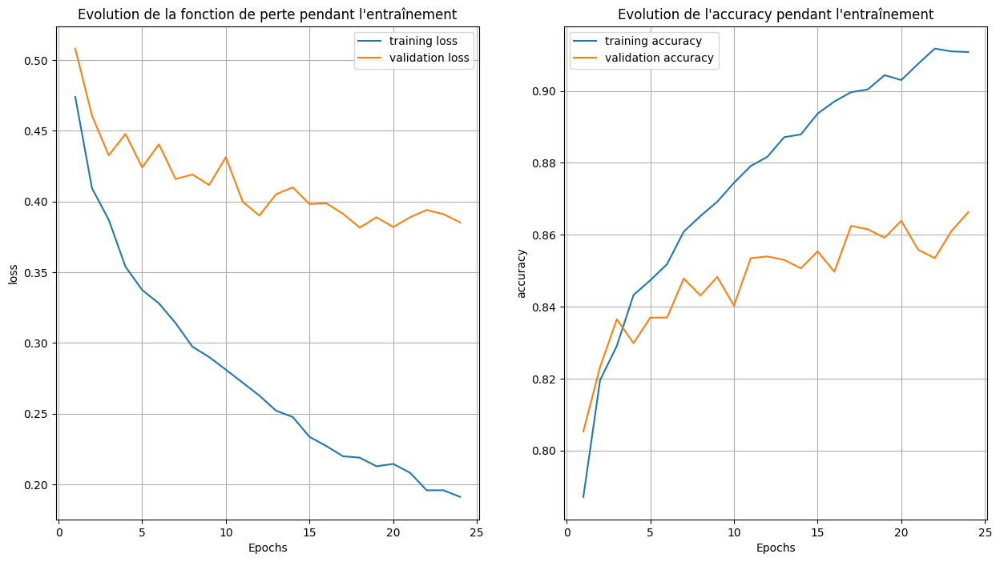

In [ ]:
# Visualisation de l'historique de'entraînement
train_loss = history_model_3_finetuning.history['loss']
validation_loss = history_model_3_finetuning.history['val_loss']

train_acc = history_model_3_finetuning.history['accuracy']
validation_acc = history_model_3_finetuning.history['val_accuracy']

plt.figure(figsize=(15,8))
plt.subplot(121)
plt.plot(np.arange(1,25,1), train_loss, label='training loss')
plt.plot(np.arange(1,25,1), validation_loss, label='validation loss')
plt.title("Evolution de la fonction de perte pendant l'entraînement")
plt.xlabel('Epochs')
plt.ylabel("loss")
plt.legend()
plt.grid('off')

plt.subplot(122)
plt.plot(np.arange(1,25,1), train_acc, label='training accuracy')
plt.plot(np.arange(1,25,1), validation_acc, label='validation accuracy')
plt.title("Evolution de l'accuracy pendant l'entraînement")
plt.xlabel('Epochs')
plt.ylabel("accuracy")
plt.legend()
plt.grid('off')

plt.show()

## Partie 3.4 : Test avec davantage de couches denses

### 3.4.1 : Entraînement des couches denses

In [ ]:
# Définition des callbacks

model_path = r"notebooks\AntoineB\artifacts\models\model_tl_xception_data_augmented_3.keras"

modelcheckpoint = ModelCheckpoint(filepath=model_path,
                                  monitor='val_loss',
                                  verbose=0,
                                  save_best_only=True,
                                  mode="min")

earlystop = EarlyStopping(monitor="val_loss",
                          mode="min",
                          min_delta=0,
                          patience=6,
                          verbose=1,
                          restore_best_weights=True)

reducelr = ReduceLROnPlateau(monitor="val_loss",
                             min_delta=0.001,
                             patience=3,
                             factor=0.5,
                             cooldown=2,
                             verbose=1)

In [ ]:
with tf.device('/GPU:0'):

  # Modèle Xception
  base_model = Xception(weights='imagenet', include_top=False, input_shape=(299,299,3), pooling="max")

  # Freeze des couches du Xception
  base_model.trainable = False

  # Couche d'entrée
  inputs = Input(shape=(299, 299, 3))

  # Data augmentation
  x = RandomFlip("horizontal")(inputs)
  x = RandomRotation(0.1, fill_mode='constant', fill_value=0)(x)
  x = RandomZoom(0.2, fill_mode='constant', fill_value=0)(x)
  x = RandomContrast(0.2)(x)

  # Scaling
  x = Rescaling(scale=1./127.5, offset=-1)(x)

  # Construction du modèle
  x = base_model(x)
  x = Dense(1024, activation="relu")(x)
  x = Dropout(rate=0.2)(x)
  x = Dense(512, activation="relu")(x)
  x = Dropout(rate=0.2)(x)
  x = Dense(256, activation="relu")(x)
  x = Dropout(rate=0.2)(x)
  outputs = Dense(4, activation="softmax")(x)

  model = Model(inputs=inputs, outputs=outputs)
  optimizer = tf.keras.optimizers.Adamax(learning_rate=0.001)
  model.compile(loss='sparse_categorical_crossentropy', optimizer=optimizer, metrics=['accuracy'])

  model.summary()

83683744/83683744 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 299, 299, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_flip (RandomFlip)             │ (None, 299, 299, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_rotation (RandomRotation)     │ (None, 299, 299, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_zoom (RandomZoom)             │ (None, 299, 299, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_contrast (RandomContrast)     │ (None, 299, 299, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ rescaling (Rescaling)                │ (None, 299, 299, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ xception (Functional)                │ (None, 2048)                │      20,861,480 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 1024)                │       2,098,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 1024)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 512)                 │         524,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 256)                 │         131,328 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 4)                   │           1,028 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,616,812 (90.09 MB)

 Trainable params: 2,755,332 (10.51 MB)

 Non-trainable params: 20,861,480 (79.58 MB)

In [ ]:
with tf.device('/GPU:0'):
  history_model_4 = model.fit(train_ds,
                              validation_data=val_ds,
                              batch_size=32,
                              epochs=100,
                              class_weight=class_weight_dict,
                              callbacks=[earlystop, reducelr, modelcheckpoint])

Epoch 1/100
530/530 ━━━━━━━━━━━━━━━━━━━━ 542s 1s/step - accuracy: 0.5402 - loss: 1.1707 - val_accuracy: 0.6664 - val_loss: 0.8243 - learning_rate: 0.0010
Epoch 2/100
530/530 ━━━━━━━━━━━━━━━━━━━━ 23s 43ms/step - accuracy: 0.6838 - loss: 0.6924 - val_accuracy: 0.7188 - val_loss: 0.7086 - learning_rate: 0.0010
Epoch 3/100
530/530 ━━━━━━━━━━━━━━━━━━━━ 23s 43ms/step - accuracy: 0.7046 - loss: 0.6442 - val_accuracy: 0.7538 - val_loss: 0.6793 - learning_rate: 0.0010
Epoch 4/100
530/530 ━━━━━━━━━━━━━━━━━━━━ 22s 42ms/step - accuracy: 0.7264 - loss: 0.6043 - val_accuracy: 0.7273 - val_loss: 0.6984 - learning_rate: 0.0010
Epoch 5/100
530/530 ━━━━━━━━━━━━━━━━━━━━ 22s 41ms/step - accuracy: 0.7326 - loss: 0.5889 - val_accuracy: 0.7297 - val_loss: 0.6907 - learning_rate: 0.0010
Epoch 6/100
530/530 ━━━━━━━━━━━━━━━━━━━━ 23s 43ms/step - accuracy: 0.7407 - loss: 0.5711 - val_accuracy: 0.7363 - val_loss: 0.6756 - learning_rate: 0.0010
Epoch 7/100
530/530 ━━━━━━━━━━━━━━━━━━━━ 23s 43ms/step - accuracy: 0.74

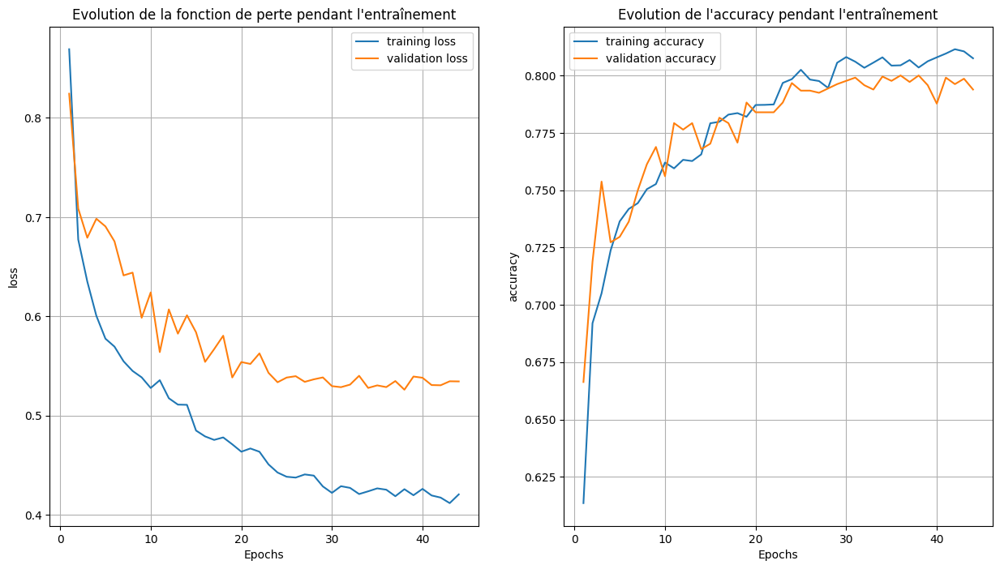

In [ ]:
# Visualisation de l'historique de'entraînement
train_loss = history_model_4.history['loss']
validation_loss = history_model_4.history['val_loss']

train_acc = history_model_4.history['accuracy']
validation_acc = history_model_4.history['val_accuracy']

plt.figure(figsize=(15,8))
plt.subplot(121)
plt.plot(np.arange(1,45,1), train_loss, label='training loss')
plt.plot(np.arange(1,45,1), validation_loss, label='validation loss')
plt.title("Evolution de la fonction de perte pendant l'entraînement")
plt.xlabel('Epochs')
plt.ylabel("loss")
plt.legend()
plt.grid('off')

plt.subplot(122)
plt.plot(np.arange(1,45,1), train_acc, label='training accuracy')
plt.plot(np.arange(1,45,1), validation_acc, label='validation accuracy')
plt.title("Evolution de l'accuracy pendant l'entraînement")
plt.xlabel('Epochs')
plt.ylabel("accuracy")
plt.legend()
plt.grid('off')

plt.show()

67/67 ━━━━━━━━━━━━━━━━━━━━ 5s 52ms/step


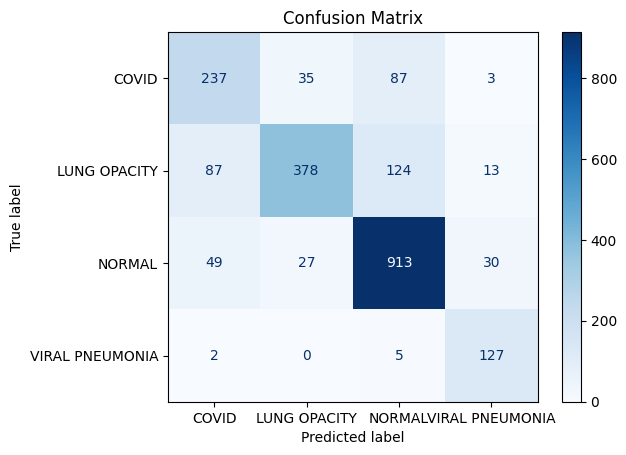

In [ ]:
# Création de la matrice de confusion sur les données de test
true_labels = np.concatenate([y for _, y in test_ds], axis=0)
predictions = model.predict(test_ds)  # Prédictions du modèle
predicted_classes = np.argmax(predictions, axis=1)  # Classes prédites

# Créez la matrice de confusion
cm = confusion_matrix(true_labels, predicted_classes)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)

# Affichez la matrice
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix")
plt.show()

### 3.4.2 : Fine-tuning

In [ ]:
with tf.device('/GPU:0'):

  for layer in base_model.layers[:]:
      layer.trainable = True

  optimizer = tf.keras.optimizers.Adamax(learning_rate=1e-4)
  model.compile(loss='sparse_categorical_crossentropy', optimizer=optimizer, metrics=['accuracy'])

In [ ]:
with tf.device('/GPU:0'):
  history_model_5 = model.fit(train_ds,
                              validation_data=val_ds,
                              batch_size=32,
                              epochs=100,
                              initial_epoch=38,
                              class_weight=class_weight_dict,
                              callbacks=[earlystop, reducelr, modelcheckpoint])

Epoch 39/100
530/530 ━━━━━━━━━━━━━━━━━━━━ 140s 207ms/step - accuracy: 0.6977 - loss: 0.7425 - val_accuracy: 0.5898 - val_loss: 0.9998 - learning_rate: 1.0000e-04
Epoch 40/100
530/530 ━━━━━━━━━━━━━━━━━━━━ 107s 201ms/step - accuracy: 0.8078 - loss: 0.4223 - val_accuracy: 0.8020 - val_loss: 0.5760 - learning_rate: 1.0000e-04
Epoch 41/100
530/530 ━━━━━━━━━━━━━━━━━━━━ 144s 204ms/step - accuracy: 0.8350 - loss: 0.3645 - val_accuracy: 0.8195 - val_loss: 0.4799 - learning_rate: 1.0000e-04
Epoch 42/100
530/530 ━━━━━━━━━━━━━━━━━━━━ 108s 205ms/step - accuracy: 0.8638 - loss: 0.3173 - val_accuracy: 0.8303 - val_loss: 0.4399 - learning_rate: 1.0000e-04
Epoch 43/100
530/530 ━━━━━━━━━━━━━━━━━━━━ 108s 205ms/step - accuracy: 0.8762 - loss: 0.2813 - val_accuracy: 0.8308 - val_loss: 0.4324 - learning_rate: 1.0000e-04
Epoch 44/100
530/530 ━━━━━━━━━━━━━━━━━━━━ 107s 201ms/step - accuracy: 0.8859 - loss: 0.2597 - val_accuracy: 0.8110 - val_loss: 0.4756 - learning_rate: 1.0000e-04
Epoch 45/100
530/530 ━━━━━━━

In [ ]:
combined_history = {key: history_model_4.history[key][:33] + history_model_5.history[key] for key in history_model_4.history.keys()}

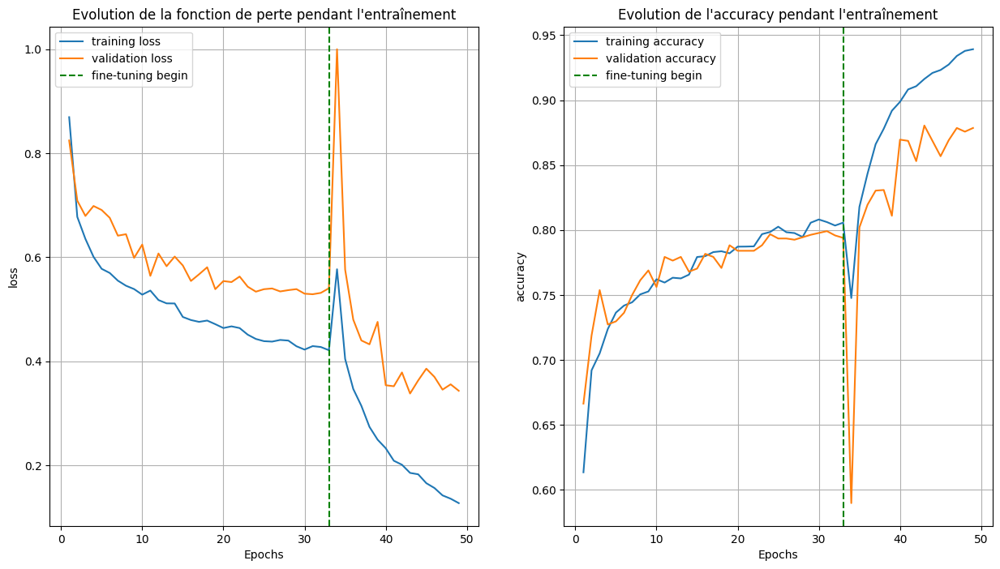

In [ ]:
# Visualisation de l'historique de'entraînement
train_loss = combined_history['loss']
validation_loss = combined_history['val_loss']

train_acc = combined_history['accuracy']
validation_acc = combined_history['val_accuracy']

plt.figure(figsize=(15,8))
plt.subplot(121)
plt.plot(np.arange(1,50,1), train_loss, label='training loss')
plt.plot(np.arange(1,50,1), validation_loss, label='validation loss')
plt.axvline(x=33, color='g', linestyle='--', label='fine-tuning begin')
plt.title("Evolution de la fonction de perte pendant l'entraînement")
plt.xlabel('Epochs')
plt.ylabel("loss")
plt.legend()
plt.grid('off')

plt.subplot(122)
plt.plot(np.arange(1,50,1), train_acc, label='training accuracy')
plt.plot(np.arange(1,50,1), validation_acc, label='validation accuracy')
plt.axvline(x=33, color='g', linestyle='--', label='fine-tuning begin')
plt.title("Evolution de l'accuracy pendant l'entraînement")
plt.xlabel('Epochs')
plt.ylabel("accuracy")
plt.legend()
plt.grid('off')

plt.show()

67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step


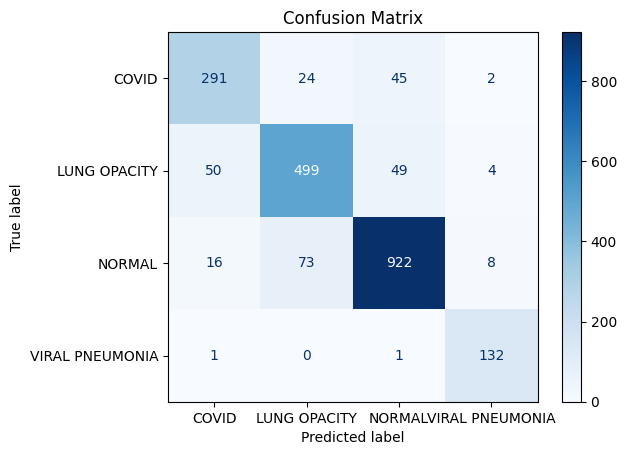

              precision    recall  f1-score   support

           0       0.81      0.80      0.81       362
           1       0.84      0.83      0.83       602
           2       0.91      0.90      0.91      1019
           3       0.90      0.99      0.94       134

    accuracy                           0.87      2117
   macro avg       0.87      0.88      0.87      2117
weighted avg       0.87      0.87      0.87      2117



In [ ]:
# Création de la matrice de confusion sur les données de test
predictions = model.predict(test_ds)  # Prédictions du modèle
predicted_classes = np.argmax(predictions, axis=1)  # Classes prédites

# Créez la matrice de confusion
cm = confusion_matrix(true_labels, predicted_classes)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)

# Affichez la matrice
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix")
plt.show()

# Affichage du rapport de classification
print(classification_report(true_labels, predicted_classes))

# Partie 4: Interprétabilité

In [5]:
# Réimportation du dernier modèle

from tensorflow.keras.models import load_model

model = load_model(get_absolute_path(r"notebooks\AntoineB\artifacts\models\model_tl_xception_data_augmented_3.keras"))
base_model = model.get_layer("xception")
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 299, 299, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_flip (RandomFlip)        │ (None, 299, 299, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_rotation                 │ (None, 299, 299, 3)    │             0 │
│ (RandomRotation)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_zoom (RandomZoom)        │ (None, 299, 299, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_contrast                 │ (None, 299, 299, 3)    │             0 │
│ (RandomContrast)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling (Rescaling)           │ (None, 299, 299, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ xception (Functional)           │ (None, 2048)           │    20,861,480 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1024)           │     2,098,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 512)            │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 4)              │         1,028 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 70,741,382 (269.86 MB)

 Trainable params: 23,562,284 (89.88 MB)

 Non-trainable params: 54,528 (213.00 KB)

 Optimizer params: 47,124,570 (179.77 MB)

67/67 ━━━━━━━━━━━━━━━━━━━━ 82s 1s/step


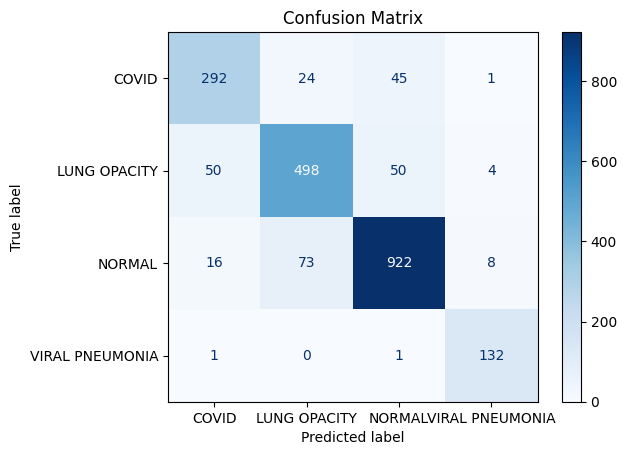

              precision    recall  f1-score   support

           0       0.81      0.81      0.81       362
           1       0.84      0.83      0.83       602
           2       0.91      0.90      0.91      1019
           3       0.91      0.99      0.95       134

    accuracy                           0.87      2117
   macro avg       0.87      0.88      0.87      2117
weighted avg       0.87      0.87      0.87      2117



In [ ]:
# Création de la matrice de confusion sur les données de test
true_labels = np.concatenate([y for _, y in test_ds], axis=0)
predictions = model.predict(test_ds)  # Prédictions du modèle
predicted_classes = np.argmax(predictions, axis=1)  # Classes prédites

# Créez la matrice de confusion
cm = confusion_matrix(true_labels, predicted_classes)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)

# Affichez la matrice
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix")
plt.show()

# Affichage du rapport de classification
classification_report = classification_report(true_labels, predicted_classes)
print(classification_report)


np.save(get_absolute_path(r"reports/figures/Classification_report_TL_xception"), classification_report)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 779ms/step


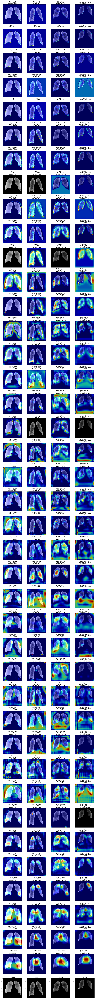

In [6]:
def grad_cam(img, model, base_model, layer_name : str, is_base_model_layer: bool):
    # Sélection de la couche dans le bon modèle
    if is_base_model_layer:
        layer = base_model.get_layer(layer_name)
        grad_model = Model(inputs=base_model.input, outputs=[layer.output, base_model.output])
        img_preprocessed = preprocess_input(img)  # Prétraitement requis pour VGG19
        img_preprocessed = tf.expand_dims(img_preprocessed, axis=0)  # Ajout de la dimension batch
    else:
        layer = model.get_layer(layer_name)
        grad_model = Model(inputs=model.input, outputs=[layer.output, model.output])
        img_preprocessed = preprocess_input(img)  # Prétraitement requis pour VGG19
        img_preprocessed = tf.expand_dims(img_preprocessed, axis=0)  # Ajout de la dimension batch


    # Calcul des gradients
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_preprocessed)
        predicted_class = tf.argmax(predictions[0])
        loss = predictions[:, predicted_class]

    # Calcul des gradients par rapport aux activations de la couche convolutionnelle
    grads = tape.gradient(loss, conv_outputs)

    # Moyenne pondérée des gradients pour chaque canal
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Pondération des activations par les gradients calculés
    conv_outputs = conv_outputs[0] # Supprimer la dimension batch
    heatmap = tf.reduce_sum(tf.multiply(pooled_grads, conv_outputs), axis=-1)

    # Normalisation de la heatmap
    heatmap = tf.maximum(heatmap, 0) # Se concentrer uniquement sur les valeurs positives
    heatmap /= tf.math.reduce_max(heatmap) # Normalisation entre 0 et 1
    heatmap = heatmap.numpy() # Convertir en tableau numpy pour la visualisation

    # Redimensionner la heatmap pour correspondre à la taille de l'image d'origine
    heatmap_resized = tf.image.resize(heatmap[..., np.newaxis], (img_preprocessed.shape[1], img_preprocessed.shape[2])).numpy()
    heatmap_resized = np.squeeze(heatmap_resized, axis=-1) # Supprimer la dimension de taille 1 à la fin du tableau

    # Colorier la heatmap avec une palette (par exemple "jet")
    heatmap_colored = plt.cm.jet(heatmap_resized)[..., :3] # Récupérer les canaux R, G, B
    # Inversion des canaux BGR -> RGB
    img_rgb = img[..., ::-1]

    # Superposer la heatmap à l'image
    superposed_img = heatmap_colored * 0.7 + img / 255.0
    image_grad_cam = np.clip(superposed_img, 0, 1) # Garantit que toutes les valeurs de l'image finale se situent entre
    # 0 et 1

    return image_grad_cam, predicted_class

def show_grad_cam_cnn(images, labels, predicted_labels, model, base_model, class_names):
    number_of_images = images.shape[0]

    # Récupérer les couches convolutives du modèle principal
    conv_layers_model = [(layer.name, False) for layer in model.layers if (isinstance(layer, Conv2D) or isinstance(layer, SeparableConv2D))]

    # Ajouter les couches convolutives du modèle pré-entraîné
    conv_layers_base_model = [(layer.name, True) for layer in base_model.layers if (isinstance(layer, Conv2D) or isinstance(layer, SeparableConv2D))]

    # Fusion des deux listes
    conv_layers = conv_layers_model + conv_layers_base_model

    plt.figure(figsize=(16,164))

    for j, (layer_name, is_base_model_layer) in enumerate(conv_layers):

        for i in range(number_of_images):

            subplot_index = i + 1 + j * number_of_images
            plt.subplot(len(conv_layers)+1, number_of_images, subplot_index)

            # Obtenir l'image avec la carte de chaleur superposée
            grad_cam_image, predicted_class = grad_cam(images[i], model, base_model, layer_name, is_base_model_layer)

            # Afficher l'image avec Grad-CAM
            plt.title(f'{layer_name}\nReal: {class_names[labels[i]]}\nPredicted: {class_names[predicted_labels[i]]}')
            plt.imshow(grad_cam_image)
            plt.axis("off")
    for i in range(number_of_images):
      subplot_index = i + 1 + (len(conv_layers)) * number_of_images
      plt.subplot(len(conv_layers)+1, number_of_images, subplot_index)
      plt.title("Image " + str(i))
      plt.imshow(images[i])
    plt.tight_layout()
    plt.show()


X = np.array([img.numpy() for img, _ in test_ds.take(2)][0]).astype(np.uint8)
y = np.array([label.numpy() for _, label in test_ds.take(2)][0])

# Sélection des images spécifiques
images = X[[4, 9, 14, 19]]
labels = y[[4, 9, 14, 19]]
predicted_labels = np.argmax(model.predict(images), axis=1)

show_grad_cam_cnn(images, labels, predicted_labels, model, base_model, class_names)